# **Data Understanding**

## **Necessary Imports**

In [ ]:
import os
import numpy as np
import tensorflow as tf
import random
import keras
import math
from keras import layers
from tensorflow import data as tf_data
import matplotlib.pyplot as plt
import pandas as pd
import shutil
from PIL import Image
from tensorflow.keras import layers
from tensorflow.keras import preprocessing
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.models import Model
import matplotlib.image as mpimg

## **Data Loading**

In [ ]:
# Directory for the butterfly image dataset
data_dir = '/kaggle/input/butterfly-image-classification'

In [ ]:
# Directories for training and validation datasets
image_dir="/kaggle/input/butterfly-image-classification/train"
train_directory = os.path.join(data_dir, "train")
val_directory = os.path.join(data_dir, "validation")

In [ ]:
# Iterate and print file or subfolder
print("Contents of the directory:")
for item in os.listdir(data_dir):
    item_path = os.path.join(data_dir, item)
    if os.path.isdir(item_path):
        print(f"Subfolder: {item}")
    else:
        print(f"File: {item}")

Contents of the directory:
File: Training_set.csv
File: Testing_set.csv
Subfolder: test
Subfolder: train


In [ ]:
# Directories for training and testing datasets
train_dir = f"{data_dir}/train"
test_dir = f"{data_dir}/test"

In [ ]:
# Loading training csv
train_df = pd.read_csv(os.path.join(data_dir, "Training_set.csv"))

In [ ]:
# Loading testing csv
test_df = pd.read_csv(os.path.join(data_dir, "Testing_set.csv"))

## **Organizing the images into appropriate directories:**

In [ ]:
# Set up working directory
working_dir = '/kaggle/working/'

# Define train and validation directories
train_directory = os.path.join(working_dir, 'train')
val_directory = os.path.join(working_dir, 'validation')

# Create train and validation directories within the working directory
os.makedirs(train_directory, exist_ok=True)
os.makedirs(val_directory, exist_ok=True)

# Create subdirectories for each label in the dataset
labels = train_df["label"].value_counts().index
for label in labels:
    label_train_directory = os.path.join(train_directory, label)
    label_val_directory = os.path.join(val_directory, label)
    os.makedirs(label_train_directory, exist_ok=True)
    os.makedirs(label_val_directory, exist_ok=True)

# Shuffle the data to introduce randomness
data = train_df.sample(frac=1).reset_index(drop=True)

# Split the data into 80% train and 20% validation
val_data_count = int(len(data) * 0.2)
validation_data = data[:val_data_count]
train_data = data[val_data_count:]

# Copy the images from the original dataset directory to the appropriate label directories
for index, row in train_data.iterrows():
    file_name = row['filename']
    label = row["label"]
    source_path = os.path.join(image_dir, file_name)
    destination_directory = os.path.join(train_directory, label)
    shutil.copy(source_path, destination_directory)

for index, row in validation_data.iterrows():
    file_name = row['filename']
    label = row["label"]
    source_path = os.path.join(image_dir, file_name)
    destination_directory = os.path.join(val_directory, label)
    shutil.copy(source_path, destination_directory)

In [ ]:
# Define directories for train, validation, test
training_dir="/kaggle/working/train"
validation_dir="/kaggle/working/validation"
test_ds = '/kaggle/input/butterfly-labelled/newbutterfly/test'

### **NOTE:**
In the above code, we're just creating and defining kaggle directories for train, validation, test and splitting the training and validation data in the ratio of 80:20.

## **Image of Classes**

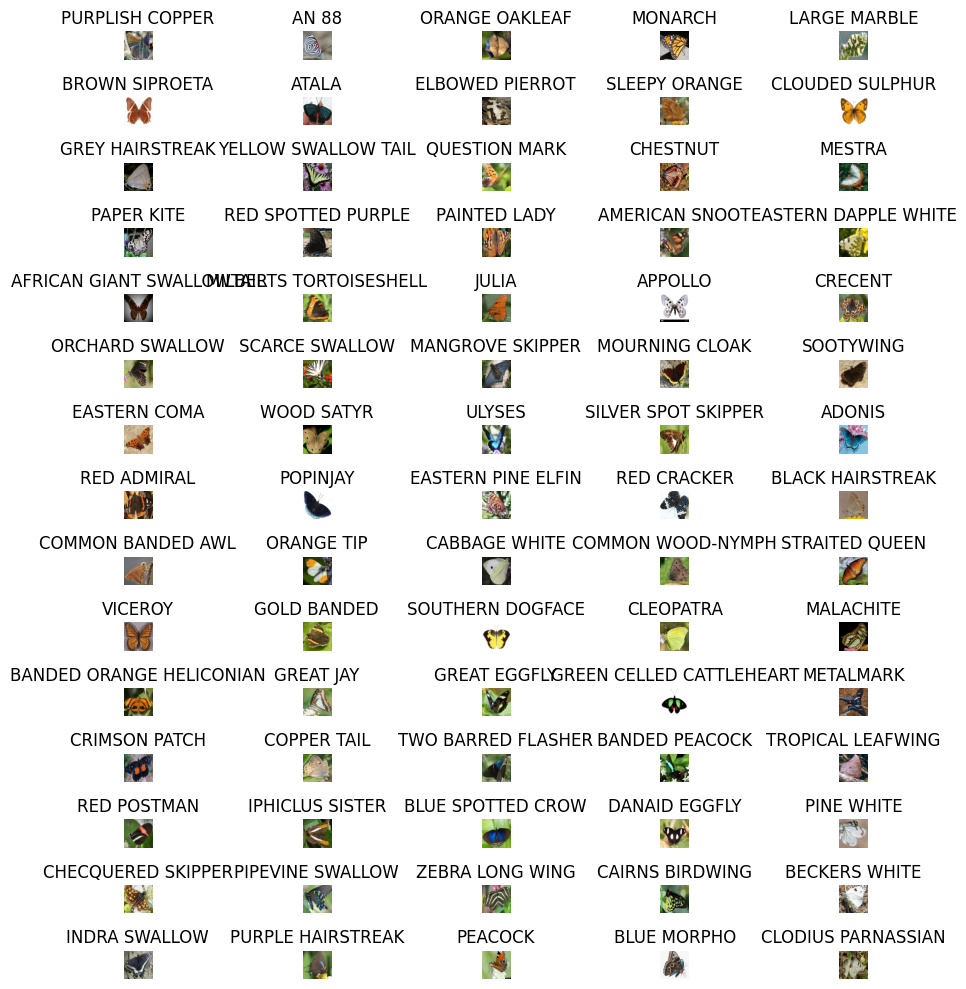

In [ ]:
# Define the number of columns for plot
columns = 5

# Create a new figure with a specified size
fig = plt.figure(figsize=(10, 10))

# Get the list of class directories in the training directory
class_directories = os.listdir(training_dir)

# Get the total number of classes
num_classes = len(class_directories)

# Calculate the number of rows required to plot
num_rows = math.ceil(num_classes / columns)

# Iterate over each class directory and display a random image from each class
for i, class_dir in enumerate(class_directories, 1):
    class_path = os.path.join(training_dir, class_dir)
    images = [f for f in os.listdir(class_path) if os.path.isfile(os.path.join(class_path, f))]
    random_image = random.choice(images)
    image_path = os.path.join(class_path, random_image)
    img = mpimg.imread(image_path)
    ax = fig.add_subplot(num_rows, columns, i)
    ax.imshow(img)
    ax.set_title(class_dir)
    ax.axis('off')

# Adjust the layout
plt.tight_layout()

plt.show()

## **Checking for corrupted images:**

In [ ]:
# Obtain list of classes (labels)
classes = os.listdir(training_dir)

# Iterate through each class directory to check image for corruption
corrupted_images = []
for class_name in classes:
    class_dir = os.path.join(training_dir, class_name)
    for image_name in os.listdir(class_dir):
        image_path = os.path.join(class_dir, image_name)
        try:
            img = Image.open(image_path)
            # Verify if image is valid
            img.verify()
        except (IOError, SyntaxError) as e:
            corrupted_images.append(image_path)
            # Remove corrupted image
            os.remove(image_path)
            print(f"Removed corrupted image: {image_path}")

# Print list of corrupted images if any
if corrupted_images:
    print("Corrupted images found:")
    for image_path in corrupted_images:
        print(image_path)
else:
    print("No corrupted images found.")

No corrupted images found.


## **Create tensorflow datasets  for training, validation, and testing:**

In [ ]:
# Specify the target size of the images
image_size = (180, 180)

# Specify number of smaples per batch during training
batch_size = 32

# Create training dataset with labels shuffled and as integer
train_ds = tf.keras.utils.image_dataset_from_directory(
    training_dir,
    shuffle=True,
    image_size=image_size,
    batch_size=batch_size,
    label_mode='int'
)

# Create validation dataset with labels shuffled and as integer
val_ds = tf.keras.utils.image_dataset_from_directory(
    validation_dir,
    shuffle=True,
    image_size=image_size,
    batch_size=batch_size,
    label_mode='int'
)

# Create testing dataset with labels shuffled and as integer
test_ds = tf.keras.utils.image_dataset_from_directory(
    test_ds,
    image_size=image_size,
    batch_size=batch_size,
    label_mode='int'
)

Found 5200 files belonging to 75 classes.
Found 1299 files belonging to 75 classes.
Found 375 files belonging to 75 classes.


## **Print the number of class and their images:**

In [ ]:
# Obtain list of class names
class_names = os.listdir(training_dir)

# Initialize dictionaries to count the number of images in each class
train_counts = {class_name: 0 for class_name in class_names}
val_counts = {class_name: 0 for class_name in class_names}

# Iterate through each batch of images and labels and update the count
for images, labels in train_ds:
    for label in labels:
        class_name = class_names[label]
        train_counts[class_name] += 1

for images, labels in val_ds:
    for label in labels:
        class_name = class_names[label]
        val_counts[class_name] += 1

# Print the number of images
print("Number of images in each class in the training dataset:")
for class_name, count in train_counts.items():
    print(f"{class_name}: {count}")

Number of images in each class in the training dataset:
CABBAGE WHITE: 73
WOOD SATYR: 55
SILVER SPOT SKIPPER: 61
GREAT EGGFLY: 73
EASTERN DAPPLE WHITE: 75
BROWN SIPROETA: 80
YELLOW SWALLOW TAIL: 74
CLOUDED SULPHUR: 70
LARGE MARBLE: 61
GREY HAIRSTREAK: 65
SLEEPY ORANGE: 56
PIPEVINE SWALLOW: 70
MALACHITE: 83
CRECENT: 73
CAIRNS BIRDWING: 61
RED CRACKER: 80
BLUE SPOTTED CROW: 71
VICEROY: 76
METALMARK: 71
DANAID EGGFLY: 73
ADONIS: 67
PINE WHITE: 73
SOUTHERN DOGFACE: 73
INDRA SWALLOW: 81
RED SPOTTED PURPLE: 55
ATALA: 77
COPPER TAIL: 77
BANDED ORANGE HELICONIAN: 70
JULIA: 80
MESTRA: 68
GREAT JAY: 55
AN 88: 67
BECKERS WHITE: 77
QUESTION MARK: 71
CLODIUS PARNASSIAN: 69
CHESTNUT: 67
AFRICAN GIANT SWALLOWTAIL: 74
SOOTYWING: 67
CHECQUERED SKIPPER: 62
APPOLLO: 57
BLACK HAIRSTREAK: 71
POPINJAY: 69
CLEOPATRA: 60
ULYSES: 71
SCARCE SWALLOW: 73
ZEBRA LONG WING: 111
TROPICAL LEAFWING: 70
RED ADMIRAL: 85
COMMON WOOD-NYMPH: 64
CRIMSON PATCH: 61
BANDED PEACOCK: 71
BLUE MORPHO: 67
MANGROVE SKIPPER: 66
ORANGE

In [ ]:
# Sort the class_names alphabetically and print
class_names_sorted = sorted(class_names)
class_names_sorted

['ADONIS', 'AFRICAN GIANT SWALLOWTAIL', 'AMERICAN SNOOT', 'AN 88', 'APPOLLO', 'ATALA', 'BANDED ORANGE HELICONIAN', 'BANDED PEACOCK', 'BECKERS WHITE', 'BLACK HAIRSTREAK', 'BLUE MORPHO', 'BLUE SPOTTED CROW', 'BROWN SIPROETA', 'CABBAGE WHITE', 'CAIRNS BIRDWING', 'CHECQUERED SKIPPER', 'CHESTNUT', 'CLEOPATRA', 'CLODIUS PARNASSIAN', 'CLOUDED SULPHUR', 'COMMON BANDED AWL', 'COMMON WOOD-NYMPH', 'COPPER TAIL', 'CRECENT', 'CRIMSON PATCH', 'DANAID EGGFLY', 'EASTERN COMA', 'EASTERN DAPPLE WHITE', 'EASTERN PINE ELFIN', 'ELBOWED PIERROT', 'GOLD BANDED', 'GREAT EGGFLY', 'GREAT JAY', 'GREEN CELLED CATTLEHEART', 'GREY HAIRSTREAK', 'INDRA SWALLOW', 'IPHICLUS SISTER', 'JULIA', 'LARGE MARBLE', 'MALACHITE', 'MANGROVE SKIPPER', 'MESTRA', 'METALMARK', 'MILBERTS TORTOISESHELL', 'MONARCH', 'MOURNING CLOAK', 'ORANGE OAKLEAF', 'ORANGE TIP', 'ORCHARD SWALLOW', 'PAINTED LADY', 'PAPER KITE', 'PEACOCK', 'PINE WHITE', 'PIPEVINE SWALLOW', 'POPINJAY', 'PURPLE HAIRSTREAK', 'PURPLISH COPPER', 'QUESTION MARK', 'RED ADMIRA

## **Augmentation:**

In [ ]:
# Define data augmentation layers
data_augmentation_layers = [
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.1),
    layers.RandomTranslation(height_factor=0.2, width_factor=0.2),
    layers.RandomZoom(height_factor=0.2, width_factor=0.2),
]

# Create a function to apply data augmentation
def data_augmentation(images):
  '''
  This function takes a batch of images as input and applies each data augmentation
  layer sequentially to augment the images. It then returns the augmented images.
  '''
    for layer in data_augmentation_layers:
        images = layer(images)
    return images

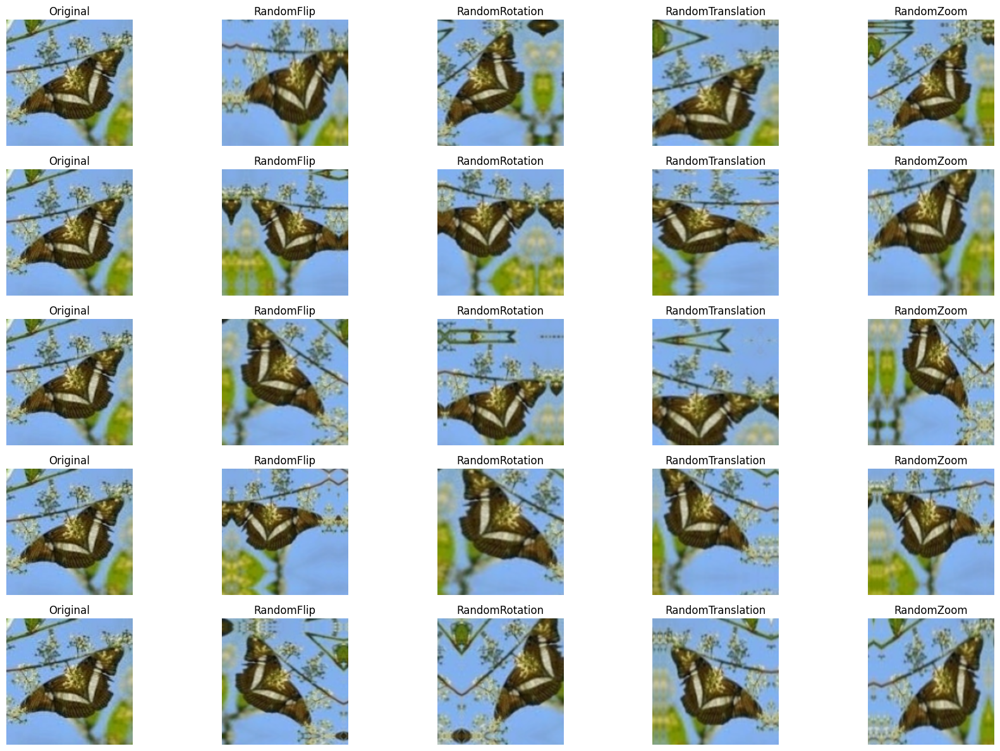

In [ ]:
# Create a function to display images with different augmentations
def display_augmented_images(original_image, augmentation_function, title, ax):

  '''
  This function takes an original image, an augmentation function, a title and an
  axis as input. It applies the augmentation function to the original image, displays
  the augmented image along with the specified title and turns off axis.
  '''
    augmented_image = augmentation_function(original_image)
    ax.imshow(augmented_image.numpy().astype("uint8"))
    ax.set_title(title)
    ax.axis('off')

# Retrieve a sample image to use as an orginal image for visualization
sample_image, _ = next(iter(train_ds.take(1)))
original_image = sample_image[0]

# Display 5 images with different augmentations
num_images_to_display = 5
fig, axes = plt.subplots(num_images_to_display, len(data_augmentation_layers) + 1, figsize=(18, 12))

# Iterates through each augmentation layer and display the original image along with its augmented versions
for i in range(num_images_to_display):
    # Plot original image
    axes[i, 0].imshow(original_image.numpy().astype("uint8"))
    axes[i, 0].set_title('Original')
    axes[i, 0].axis('off')

    # Apply data augmentation and display augmented images
    for j, augmentation_layer in enumerate(data_augmentation_layers):
        ax = axes[i, j + 1]
        display_augmented_images(original_image, data_augmentation, augmentation_layer.__class__.__name__, ax)

plt.tight_layout()
plt.show()

In [ ]:
# Apply data_augmentation function to the training images
train_ds = train_ds.map(
    lambda img, label: (data_augmentation(img), label),
    num_parallel_calls=tf_data.AUTOTUNE,
)
# Prefetch data batches in GPU memory to reduced training times
train_ds = train_ds.prefetch(tf_data.AUTOTUNE)
val_ds = val_ds.prefetch(tf_data.AUTOTUNE)
test_ds = test_ds.prefetch(tf_data.AUTOTUNE)

### **NOTE:**
In the above code, we plotted a graph containing image  of all 75 classes, then we checked for corrupted images and print if found any. After that we used image_dataset_from_directory function from keras to generate a dataset for train, validation and test from image files in a directory. We then print out number of images per class. Following that we apply data augmentation to each element to increase our image sample by flipping, rotating, translation and zooming and plotted the graph.

# **Building Fully Connected Neural Network**

## **Model Building**

In [ ]:
def make_fcn_model(input_shape, num_classes):
  '''
  This function defines a fully connected neural network model. It takes
  input_shape and num_classes as arguments and returns a Keras model.
  '''
    # Define input layer
    inputs = Input(shape=input_shape)
    # Flatten
    x = Flatten()(inputs)

    # Dense layer with 256 units and ReLU activation function
    x = Dense(256, activation='relu')(x)
    # Batch normalization layer
    x = BatchNormalization()(x)
    # Dropout layer
    x = Dropout(0.5)(x)

    # Dense layer with 128 units and ReLU activation function
    x = Dense(128, activation='relu')(x)
    # Batch normalization layer
    x = BatchNormalization()(x)
    # Dropout layer
    x = Dropout(0.5)(x)

    # Output layer with softmax activation function
    outputs = Dense(num_classes, activation='softmax')(x)

    # Define the model
    return Model(inputs, outputs)

# Create the FCN model
model = make_fcn_model(input_shape=(180, 180, 3), num_classes=75)

# Print model summary
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 180, 180, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 97200)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │    24,883,456 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 128)            │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 75)             │         9,675 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 24,927,563 (95.09 MB)

 Trainable params: 24,926,795 (95.09 MB)

 Non-trainable params: 768 (3.00 KB)

### **Define Callbacks**

In [ ]:
# Number of epochs
epochs = 50

# Define the ModelCheckpoint callback which saves the best model having minimal validation loss
checkpoint_callback = ModelCheckpoint(
    "fcn.keras",
    monitor='val_loss',
    save_best_only=True,
    mode='min',
    verbose=1
)

# Define the ReduceLROnPlateau callback which reduces the learning rate if it does not improve after 3 epochs
reduce_lr_callback = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.2,
    patience=3,
    min_lr=1e-6
)

# Define the EarlyStopping callback which stops traning if the validation loss does not improve after 5 epochs
early_stopping_callback = EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True
)

# List of callbacks
callbacks = [checkpoint_callback]

### **Model Compilation**

In [ ]:
# Compile the model with RMSprop optimizer, sparse categorical cross-entropy loss, and accuracy metric
model.compile(
    optimizer=tf.keras.optimizers.RMSprop(),
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics=['accuracy'],
)

## **Train the model**

In [ ]:
# Train the model
history = model.fit(
    train_ds,
    epochs=epochs,
    callbacks=callbacks,
    validation_data=val_ds
)

Epoch 1/50
  5/163 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - accuracy: 0.0025 - loss: 5.6651     

I0000 00:00:1714621613.255290     108 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - accuracy: 0.0215 - loss: 5.0405
Epoch 1: val_loss improved from inf to 4.76422, saving model to fcn.keras
163/163 ━━━━━━━━━━━━━━━━━━━━ 31s 156ms/step - accuracy: 0.0216 - loss: 5.0389 - val_accuracy: 0.0454 - val_loss: 4.7642
Epoch 2/50
163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step - accuracy: 0.0474 - loss: 4.3622
Epoch 2: val_loss improved from 4.76422 to 3.76997, saving model to fcn.keras
163/163 ━━━━━━━━━━━━━━━━━━━━ 21s 127ms/step - accuracy: 0.0475 - loss: 4.3615 - val_accuracy: 0.0839 - val_loss: 3.7700
Epoch 3/50
162/163 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - accuracy: 0.0566 - loss: 4.0785
Epoch 3: val_loss improved from 3.76997 to 3.57138, saving model to fcn.keras
163/163 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - accuracy: 0.0567 - loss: 4.0779 - val_accuracy: 0.1124 - val_loss: 3.5714
Epoch 4/50
162/163 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - accuracy: 0.0744 - loss: 3.9069
Epoch 4: val_loss improved from 3.57138 to 3.49365, saving model to f

### **Train VS Validation Accuracy & Loss Plot**

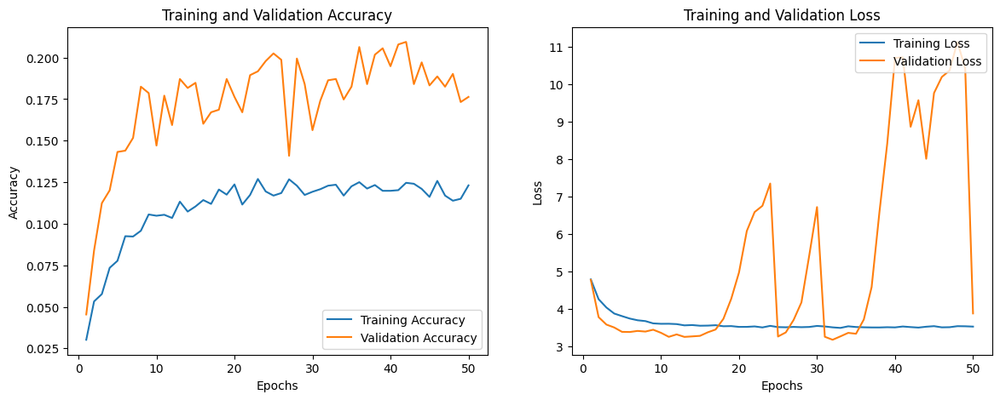

In [ ]:
# Get training and validation accuracy
train_acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

# Get training and validation loss
train_loss = history.history['loss']
val_loss = history.history['val_loss']

# Create a range of epochs
epochs_range = range(1, epochs + 1)

# Plot training and validation accuracy
plt.figure(figsize=(14, 5))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, train_acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')

# Plot training and validation loss
plt.subplot(1, 2, 2)
plt.plot(epochs_range, train_loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')

plt.show()

## **Evaluation of Model on Test**

In [ ]:
# Load the saved model
model = tf.keras.models.load_model("/kaggle/working/fcn.keras")

# Evaluate the model on the test dataset
test_loss, test_accuracy = model.evaluate(test_ds)

print(f"Test Loss: {test_loss}")
print(f"Test Accuracy: {test_accuracy}")

12/12 ━━━━━━━━━━━━━━━━━━━━ 2s 55ms/step - accuracy: 0.2082 - loss: 3.4377
Test Loss: 3.8808255195617676
Test Accuracy: 0.19466666877269745


### **NOTE:**
In the above code, we create a Fully Connected Neural Network model containing 9 layers which are input, flatten, 3 dense with reLU and softmax activation function, 2 batch_normalization and 2 dropout. We then created callback functions for saving the best model, reducing the learning rate and stopping the model with appropriate conditions. We then compiled the model with RMSprop optimizer, sparse categorical cross-entropy loss, and accuracy metric and trained the model for 50 epochs. We then plotted the Train VS Validation Accuracy & Loss graph and evaluated the model on test dataset. <br>
The graph plotted was full of noise and the accruacy was very low. We can see the model is underfitted and the reason for it can be various reasons such as architecture, optimizer, loss function.


# **Building Convolutional Neural Network**

## **Model Building**

In [ ]:
def make_cnn_model(input_shape, num_classes):
  '''
  This function defines a Convolutional Neural Network model. It takes
  input_shape and num_classes as arguments and returns a Keras model.
  '''
    # Define input layer
    inputs = Input(shape=input_shape)

    # Convolutional layers with ReLU activation, max pooling, batch normalization, and dropout
    x = Conv2D(32, (3, 3), activation='relu')(inputs)
    x = MaxPooling2D((2, 2))(x)
    x = BatchNormalization()(x)
    x = Dropout(0.4)(x)

    x = Conv2D(64, (3, 3), activation='relu')(x)
    x = MaxPooling2D((2, 2))(x)
    x = BatchNormalization()(x)
    x = Dropout(0.4)(x)

    x = Conv2D(128, (3, 3), activation='relu')(x)
    x = MaxPooling2D((2, 2))(x)
    x = BatchNormalization()(x)
    x = Dropout(0.4)(x)

    x = Conv2D(128, (3, 3), activation='relu')(x)
    x = MaxPooling2D((2, 2))(x)
    x = BatchNormalization()(x)
    x = Dropout(0.4)(x)

    x = Conv2D(128, (3, 3), activation='relu')(x)
    x = MaxPooling2D((2, 2))(x)
    x = BatchNormalization()(x)

    # Flatten layer, dense layer, batch normalization, and dropout
    x = Flatten()(x)
    x = Dense(128, activation='relu')(x)
    x = BatchNormalization()(x)
    x = Dropout(0.4)(x)

    # Output layer with softmax activation
    outputs = Dense(num_classes, activation='softmax')(x)

    # Define the model
    return Model(inputs, outputs)

# Create the CNN model
model = make_cnn_model(input_shape=(180, 180, 3), num_classes=75)

# Print model summary
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 180, 180, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 178, 178, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 89, 89, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 89, 89, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 89, 89, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 87, 87, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 43, 43, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 43, 43, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 43, 43, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 41, 41, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 20, 20, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 20, 20, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 20, 20, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 18, 18, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 9, 9, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 9, 9, 128)      │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 9, 9, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 7, 7, 128)      │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 3, 3, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 3, 3, 128)      │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 1152)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │       147,584 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 548,107 (2.09 MB)

 Trainable params: 546,891 (2.09 MB)

 Non-trainable params: 1,216 (4.75 KB)

### **Define Callbacks**

In [ ]:
# Number of epochs
epochs = 120

# Define the ModelCheckpoint callback which saves the best model having minimal validation loss
checkpoint_callback = ModelCheckpoint(
    "best_model.keras",
    monitor='val_loss',
    save_best_only=True,
    mode='min',
    verbose=1
)

# Define the ReduceLROnPlateau callback which reduces the learning rate if it does not improve after 3 epochs
reduce_lr_callback = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.2,
    patience=3,
    min_lr=1e-6
)

# Define the EarlyStopping callback which stops traning if the validation loss does not improve after 5 epochs
early_stopping_callback = EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True
)

# List of callbacks
callbacks = [checkpoint_callback]

### **Model Compilation**

In [ ]:
# Compile the model with RMSprop optimizer, sparse categorical cross-entropy loss, and accuracy metric
model.compile(
    optimizer=tf.keras.optimizers.RMSprop(),
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics=['accuracy'],
)

## **Train the Model**

In [ ]:
# Train the model
history = model.fit(
    train_ds,
    epochs=epochs,
    callbacks=callbacks,
    validation_data=val_ds
)

Epoch 1/120
  5/163 ━━━━━━━━━━━━━━━━━━━━ 5s 32ms/step - accuracy: 0.0028 - loss: 5.3989     

I0000 00:00:1714625375.370299     113 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step - accuracy: 0.0476 - loss: 4.4942
Epoch 1: val_loss improved from inf to 9.17762, saving model to best_model.keras
163/163 ━━━━━━━━━━━━━━━━━━━━ 53s 212ms/step - accuracy: 0.0477 - loss: 4.4921 - val_accuracy: 0.0423 - val_loss: 9.1776
Epoch 2/120
162/163 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - accuracy: 0.1220 - loss: 3.5653
Epoch 2: val_loss improved from 9.17762 to 4.32857, saving model to best_model.keras
163/163 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - accuracy: 0.1222 - loss: 3.5639 - val_accuracy: 0.1586 - val_loss: 4.3286
Epoch 3/120
162/163 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - accuracy: 0.1763 - loss: 3.2032
Epoch 3: val_loss improved from 4.32857 to 3.07085, saving model to best_model.keras
163/163 ━━━━━━━━━━━━━━━━━━━━ 21s 128ms/step - accuracy: 0.1765 - loss: 3.2022 - val_accuracy: 0.2263 - val_loss: 3.0709
Epoch 4/120
162/163 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - accuracy: 0.2252 - loss: 2.9130
Epoch 4: val_loss did not improve from 3.0708

### **Train VS Validation Accuracy & Loss Plot**

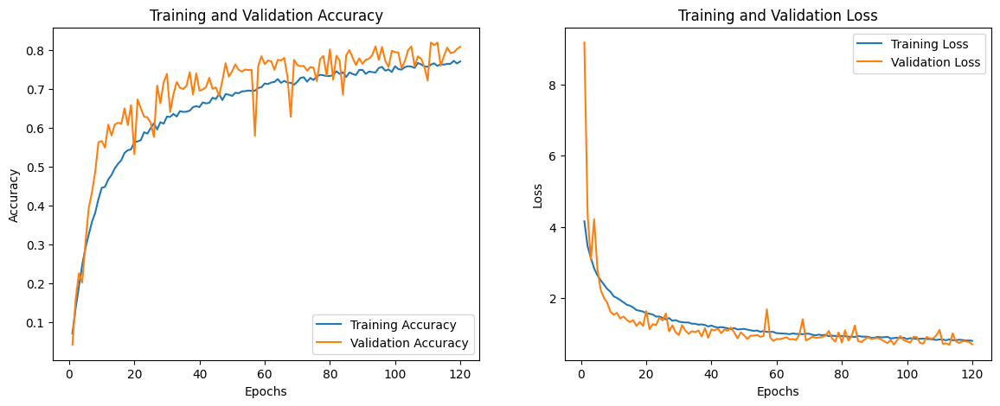

In [ ]:
# Get training and validation accuracy
train_acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

# Get training and validation loss
train_loss = history.history['loss']
val_loss = history.history['val_loss']

# Create a range of epochs
epochs_range = range(1, epochs + 1)

# Plot training and validation accuracy
plt.figure(figsize=(14, 5))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, train_acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')

# Plot training and validation loss
plt.subplot(1, 2, 2)
plt.plot(epochs_range, train_loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')

plt.show()

## **Evaluation of Model on Test**

In [ ]:
# Load the saved model
model = tf.keras.models.load_model("/kaggle/working/best_model.keras")

# Evaluate the model on the test dataset
test_loss, test_accuracy = model.evaluate(test_ds)

print(f"Test Loss: {test_loss}")
print(f"Test Accuracy: {test_accuracy}")

12/12 ━━━━━━━━━━━━━━━━━━━━ 3s 168ms/step - accuracy: 0.8565 - loss: 0.5869
Test Loss: 0.5800039172172546
Test Accuracy: 0.8506666421890259


## **Prediction of Model**

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


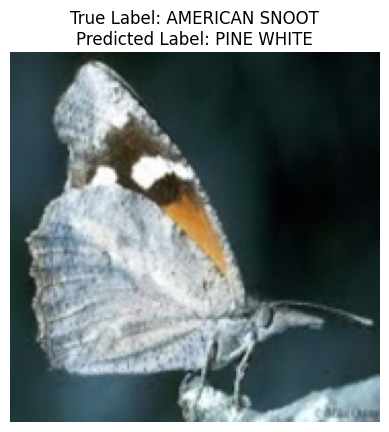

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


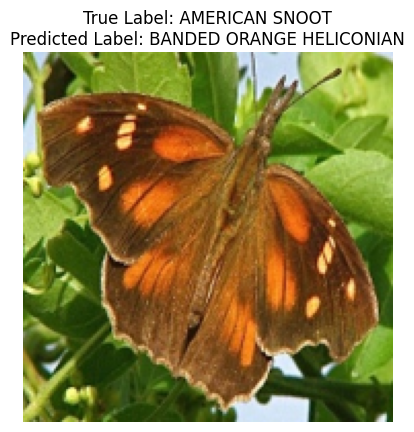

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


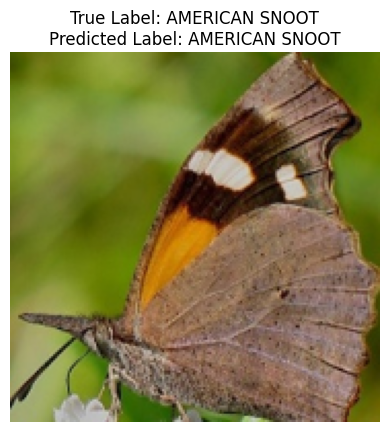

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


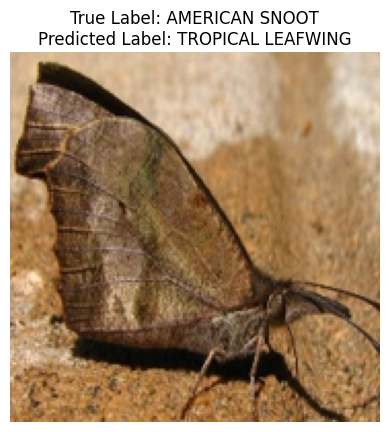

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


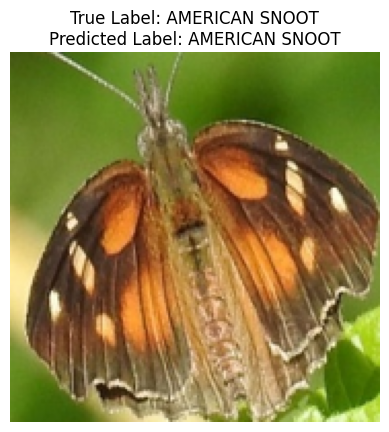

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


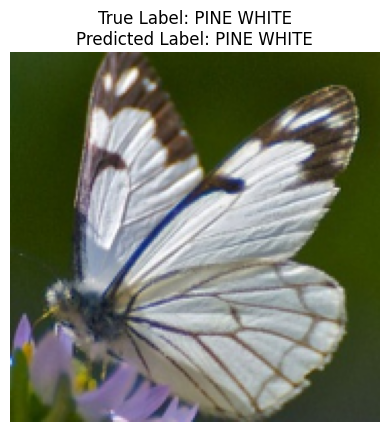

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


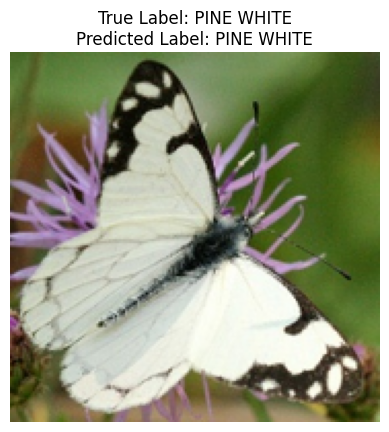

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


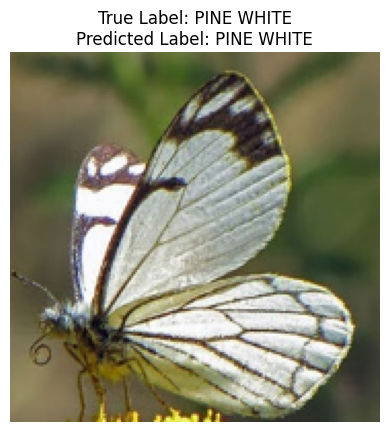

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


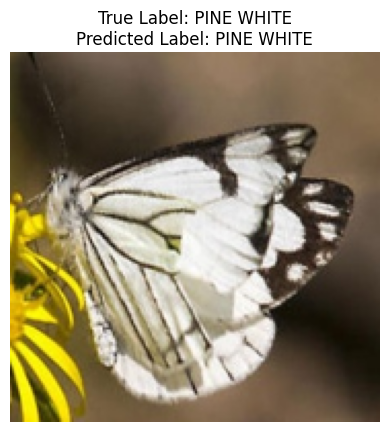

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


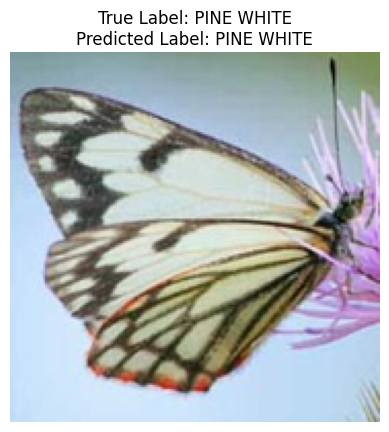

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


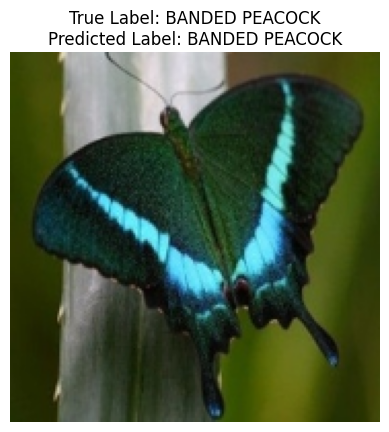

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


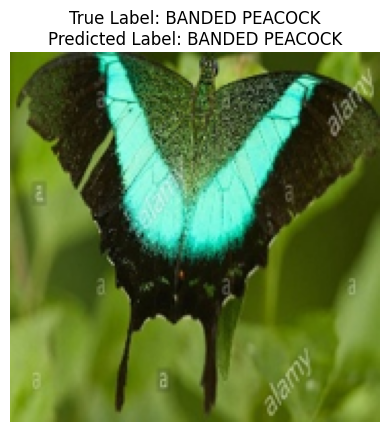

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


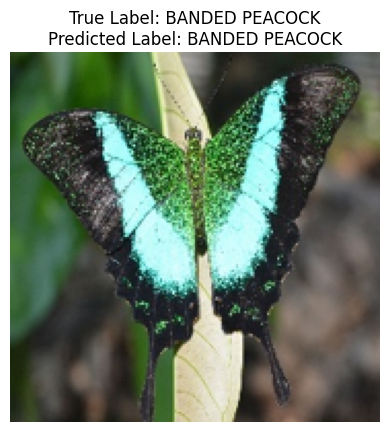

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


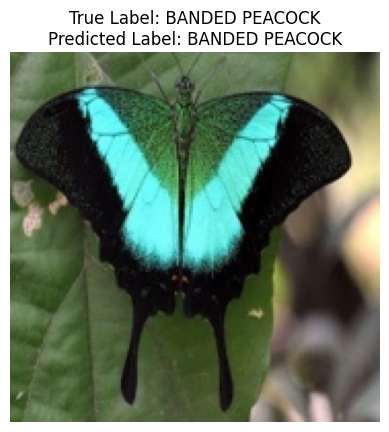

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


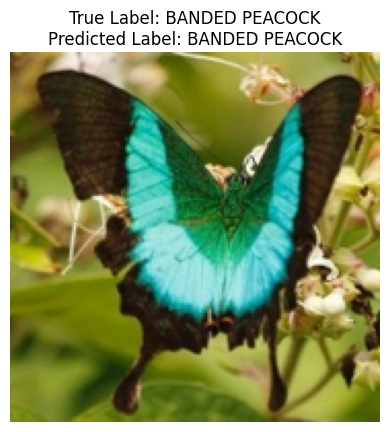

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


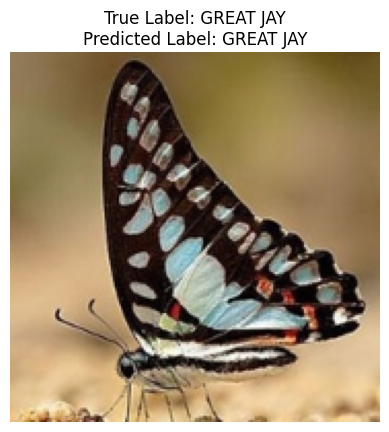

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


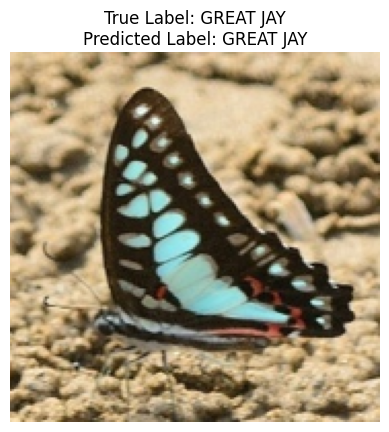

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


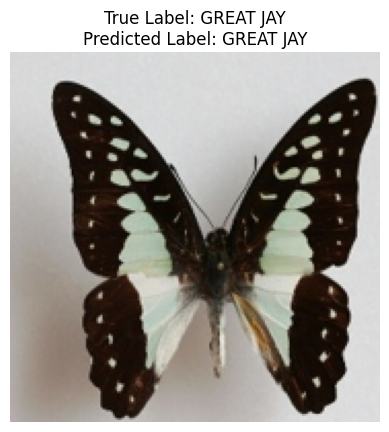

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


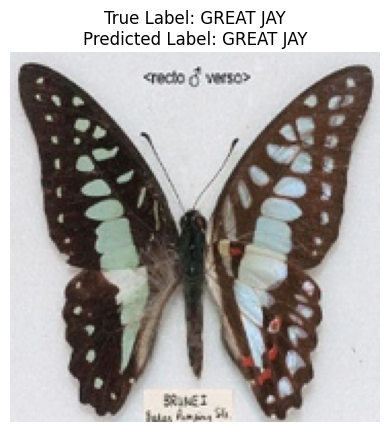

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


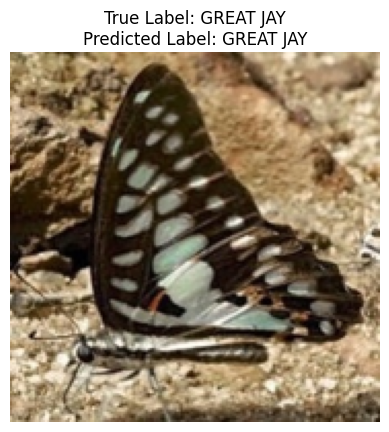

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


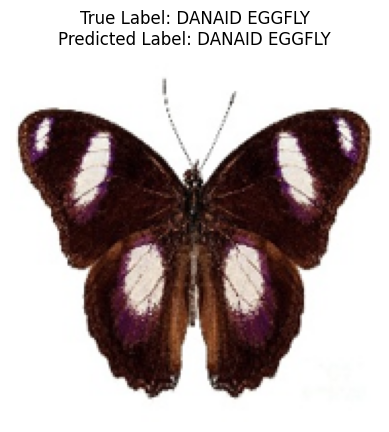

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


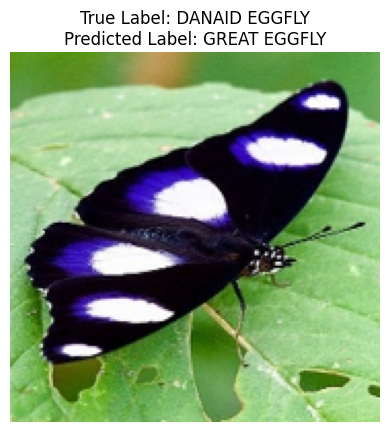

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


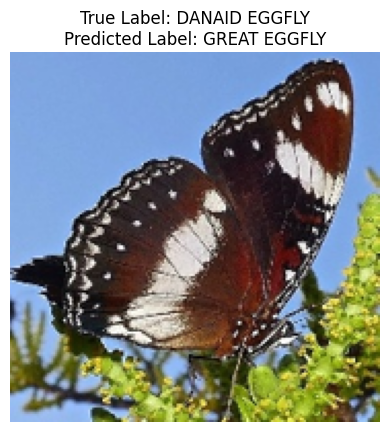

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


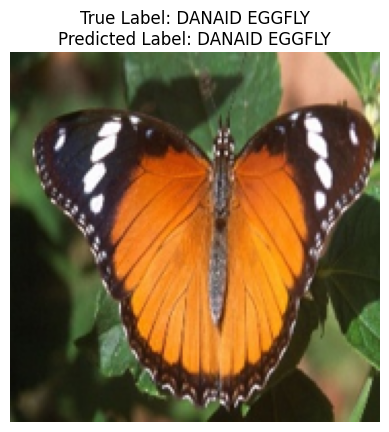

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


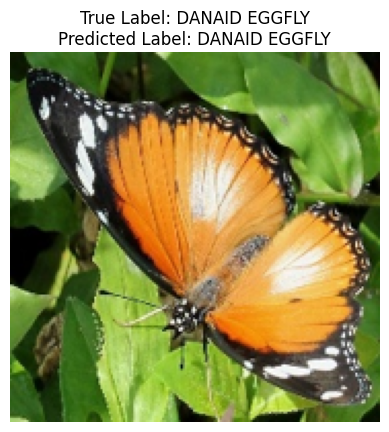

In [ ]:
# Get the alphabetically sorted class_names
class_names_sorted = sorted(class_names)

# Set the directory containing the test images
test_directory = "/kaggle/input/butterfly-labelled/newbutterfly/test"

def predict_single_image_without_preprocessing(image_path, model):
  '''
  This function loads, resizes, and predicts the
  class label for the image without any preprocessing
  '''
    # Load the image and resize it to 180x180
    img = Image.open(image_path)
    img = img.resize((180, 180))
    # Convert the image to a numpy array
    img_array = np.array(img)
    # Expand dimensions to match the input shape expected by the model
    input_img = np.expand_dims(img_array, axis=0)
    # Perform prediction
    prediction = model.predict(input_img)
    # Get the predicted class label
    predicted_class = np.argmax(prediction, axis=1)[0]
    return predicted_class

# Get class names from directories in alphabetical order
class_names = sorted(os.listdir(test_directory))

# Randomly select 5 classes
selected_classes = random.sample(class_names, 5)

# Iterate over selected classes and select 5 images from class_directory
for class_name in selected_classes:
    class_directory = os.path.join(test_directory, class_name)
    image_files = os.listdir(class_directory)
    selected_images = random.sample(image_files, 5)

    # Iterate over selected images and perform prediction
    for image_file in selected_images:
        image_path = os.path.join(class_directory, image_file)
        true_label = class_name
        predicted_class = predict_single_image_without_preprocessing(image_path, model)
        predicted_class_name = class_names_sorted[predicted_class]

        # Display the original image along with its true label and the predicted label
        img = Image.open(image_path)
        img = img.resize((180, 180))
        plt.imshow(img)
        plt.title(f"True Label: {true_label}\nPredicted Label: {predicted_class_name}")
        plt.axis('off')

        plt.show()

### **NOTE:**
In the above code, we create a Convolutional Neural Network model containing 24 layers which are 5 convolutional with relu activation function, 5 max_pooling, 6 batch_normalization, 5 dropout, 2 dense with relu and softmax activation function and flatten. We then created callback functions for saving the best model, reducing the learning rate and stopping the model with appropriate conditions. We then compiled the model with RMSprop optimizer, sparse categorical cross-entropy loss, and accuracy metric and trained the model for 120 epochs. We then plotted the Train VS Validation Accuracy & Loss graph and evaluated the model on test dataset and plotted predictions. <br>

The graph plotted still has noise but it is significantly lower than that of FCN and the accruacy is also good with minimum loss. We can see the model is converging optimally and its generalizing accurately with only some errors.


# **Transfer Learning**

## **Select and a Load Pre-Trained Model**

In [ ]:
# Apply specific preprocessing required by ResNet V2 model
preprocess_input = tf.keras.applications.resnet_v2.preprocess_input

In [ ]:
# Define input shape for the model
IMG_SHAPE = image_size + (3,)

In [ ]:
# Load the ResNet152V2 model pre-trained on ImageNet dataset excluding fully connected layers and using pre-trained weights
base_model = tf.keras.applications.ResNet152V2(input_shape=IMG_SHAPE,
                                               include_top=False,
                                               weights='imagenet'
                                               )

234545216/234545216 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


In [ ]:
# Retrieve a batch of images and labels from the training dataset
image_batch, label_batch = next(iter(train_ds))

# Pass the batch of images through the base model to obtain the output features
feature_batch = base_model(image_batch)

# Print the shape of the output features
print(feature_batch.shape)

(32, 6, 6, 2048)


## **Restructure the Model**

In [ ]:
#Freeze the convolutional base
base_model.trainable = False

In [ ]:
# Define Global Average Pooling layer
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()

# Apply the Global Average Pooling operation to the input features
feature_batch_average = global_average_layer(feature_batch)

# Print the shape of the output features
print(feature_batch_average.shape)

(32, 2048)


In [ ]:
# Define Dense layer for prediction
prediction_layer = tf.keras.layers.Dense(75, activation='softmax')

# Pass the output features through the Dense layer
prediction_batch = prediction_layer(feature_batch_average)

# Print the shape of the output features
print(prediction_batch.shape)

(32, 75)


In [ ]:
# Define input layer
inputs = tf.keras.Input(shape=(180, 180, 3))

# Apply data augmentation to input images
x = data_augmentation(inputs)

# Preprocess input images using ResNet V2 preprocessing function
x = preprocess_input(x)

# Pass preprocessed images through the base model (ResNet152V2) with frozen weights
x = base_model(x, training=False)

# Apply global average pooling
x = global_average_layer(x)

# Add a dense layer
x = tf.keras.layers.Dense(2048, activation='relu')(x)

# Add dropout layer
x = tf.keras.layers.Dropout(0.5)(x)

# Add prediction layer
outputs = prediction_layer(x)

# Define the model with inputs and outputs
model = tf.keras.Model(inputs, outputs)

### **Define Callbacks**

In [ ]:
# Define the ModelCheckpoint callback which saves the best model having minimal validation loss
checkpoint_callback = ModelCheckpoint(
    "best_model.keras",
    monitor='val_loss',
    save_best_only=True,
    mode='min',
    verbose=1
)

# Define the ReduceLROnPlateau callback which reduces the learning rate if it does not improve after 3 epochs
reduce_lr_callback = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.2,
    patience=3,
    min_lr=1e-6
)

# Define the EarlyStopping callback which stops traning if the validation loss does not improve after 5 epochs
early_stopping_callback = EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True
)

# List of callbacks
callbacks = [checkpoint_callback]

### **Model Complilation**

In [ ]:
# Compile the model with learning rate, RMSprop optimizer, sparse categorical cross-entropy loss, and accuracy metric
base_learning_rate = 0.0001
model.compile(optimizer=keras.optimizers.RMSprop(learning_rate=base_learning_rate),
              loss=keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [ ]:
# Print model summary
print(model.summary())

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 180, 180, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_flip (RandomFlip)        │ (None, 180, 180, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_rotation                 │ (None, 180, 180, 3)    │             0 │
│ (RandomRotation)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_translation              │ (None, 180, 180, 3)    │             0 │
│ (RandomTranslation)             │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_zoom (RandomZoom)        │ (None, 180, 180, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ true_divide (TrueDivide)        │ (None, 180, 180, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ subtract (Subtract)             │ (None, 180, 180, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ resnet152v2 (Functional)        │ (None, 6, 6, 2048)     │    58,331,648 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 2048)           │     4,196,352 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 75)             │       153,675 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 62,681,675 (239.11 MB)

 Trainable params: 4,350,027 (16.59 MB)

 Non-trainable params: 58,331,648 (222.52 MB)

None


### **Evaluation on Validation Dataset**

In [ ]:
# Number of epochs
initial_epochs = 35

# Evaluate the model on the validation dataset
loss0, accuracy0 = model.evaluate(val_ds)

41/41 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - accuracy: 0.0143 - loss: 4.9243


### **Model Training**

In [ ]:
# Train the model
history = model.fit(train_ds,
                    epochs=initial_epochs,
                    callbacks=callbacks,
                    validation_data=val_ds)

Epoch 1/35
163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step - accuracy: 0.1627 - loss: 3.8237
Epoch 1: val_loss improved from inf to 1.58647, saving model to transfer_model.keras
163/163 ━━━━━━━━━━━━━━━━━━━━ 52s 191ms/step - accuracy: 0.1634 - loss: 3.8188 - val_accuracy: 0.5905 - val_loss: 1.5865
Epoch 2/35
163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step - accuracy: 0.5214 - loss: 1.7754
Epoch 2: val_loss improved from 1.58647 to 1.13977, saving model to transfer_model.keras
163/163 ━━━━━━━━━━━━━━━━━━━━ 30s 183ms/step - accuracy: 0.5216 - loss: 1.7748 - val_accuracy: 0.6767 - val_loss: 1.1398
Epoch 3/35
163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step - accuracy: 0.6321 - loss: 1.3040
Epoch 3: val_loss improved from 1.13977 to 0.95312, saving model to transfer_model.keras
163/163 ━━━━━━━━━━━━━━━━━━━━ 30s 183ms/step - accuracy: 0.6322 - loss: 1.3037 - val_accuracy: 0.7236 - val_loss: 0.9531
Epoch 4/35
163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step - accuracy: 0.6939 - loss: 1.0860
Epoch 4: val_loss improve

### **Train VS Validation Accuracy & Loss Plot**

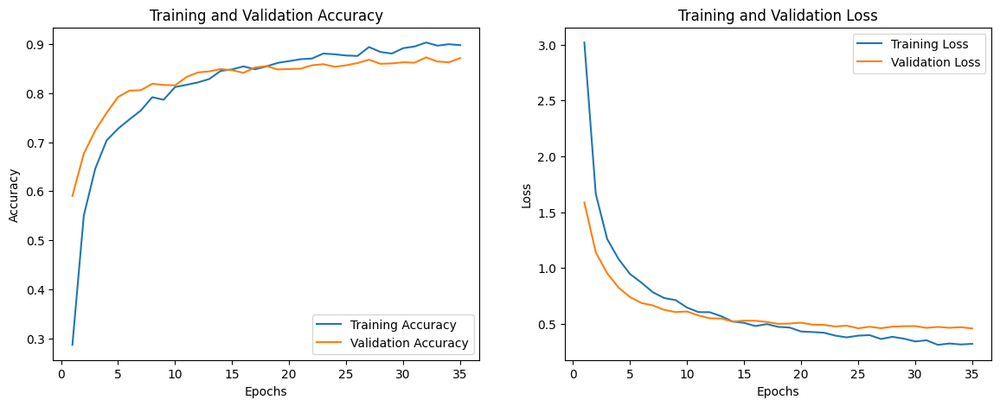

In [ ]:
# Get training and validation accuracy
train_acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

# Get training and validation loss
train_loss = history.history['loss']
val_loss = history.history['val_loss']

# Create a range of epochs
epochs_range = range(1, initial_epochs + 1)

# Plot training and validation accuracy
plt.figure(figsize=(14, 5))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, train_acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')

# Plot training and validation loss
plt.subplot(1, 2, 2)
plt.plot(epochs_range, train_loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')

plt.show()

## **Evaluation of Model on Test**

In [ ]:
# Load the saved model
model = keras.models.load_model("/kaggle/working/transfer_model.keras")

# Evaluate the model on the test dataset
test_loss, test_accuracy = model.evaluate(test_ds)

print(f"Test Loss: {test_loss}")
print(f"Test Accuracy: {test_accuracy}")

12/12 ━━━━━━━━━━━━━━━━━━━━ 12s 227ms/step - accuracy: 0.8912 - loss: 0.3493
Test Loss: 0.37459349632263184
Test Accuracy: 0.8933333158493042


### **NOTE**
In the above code, we first preprocess input images for ResNet V2 and define the shape, then we load the ResNet152V2 architecture with pre-trained weights from the ImageNet dataset. Then we get the outfut features and freeze the convulutional base. Then we define 12 layers, input, global pooling, dense prediction with softmax activation function, 4 data augmentation, dropout etc. We then created callback functions for saving the best model, reducing the learning rate and stopping the model with appropriate conditions. We then compiled the model with learning rate, RMSprop optimizer, sparse categorical cross-entropy loss, and accuracy metric and trained for 35 epochs. We then plotted the Train VS Validation Accuracy & Loss graph and evaluated the model on test dataset.<br>

The graph plotted had significant less noise than any of the above model and was by far the best performing in terms of plot and the accruacy with minimum loss. Here the model is also converging better than the two models above.


In [ ]:
# Text Directory
test_directory ='/kaggle/input/butterfly-labelled/newbutterfly/test'

## **Fine-Tuning**

In [ ]:
# Allow fine tuning of base model
base_model.trainable = True

In [ ]:
# Print the number of layers in the base mode
print("Number of layers in the base model: ", len(base_model.layers))

Number of layers in the base model:  564


In [ ]:
# Define the index of the layer from which fine-tuning will start
fine_tune_at = 250

In [ ]:
# Iterate through all the layers in the base model and freezes them up to the fine_tune_at layer
for layer in base_model.layers[:fine_tune_at]:
  layer.trainable = False

### **Define Callbacks + Compile the Model + Model Summary**

In [ ]:
# Define the ModelCheckpoint callback which saves the best model having minimal validation loss
checkpoint_callback = ModelCheckpoint(
    "best_model.keras",
    monitor='val_loss',
    save_best_only=True,
    mode='min',
    verbose=1
)

# Define the ReduceLROnPlateau callback which reduces the learning rate if it does not improve after 3 epochs
reduce_lr_callback = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.2,
    patience=3,
    min_lr=1e-6
)

# Define the EarlyStopping callback which stops traning if the validation loss does not improve after 5 epochs
early_stopping_callback = EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True
)

# List of callbacks
callbacks = [checkpoint_callback]

# Compile the model with reduced learning rate, RMSprop optimizer, sparse categorical cross-entropy loss, and accuracy metric
model.compile(loss=keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              optimizer = keras.optimizers.RMSprop(learning_rate=base_learning_rate/5),
              metrics=['accuracy'])

# Print the model summary
print(model.summary())

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 180, 180, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_flip (RandomFlip)        │ (None, 180, 180, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_rotation                 │ (None, 180, 180, 3)    │             0 │
│ (RandomRotation)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_translation              │ (None, 180, 180, 3)    │             0 │
│ (RandomTranslation)             │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_zoom (RandomZoom)        │ (None, 180, 180, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ true_divide (TrueDivide)        │ (None, 180, 180, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ subtract (Subtract)             │ (None, 180, 180, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ resnet152v2 (Functional)        │ (None, 6, 6, 2048)     │    58,331,648 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 2048)           │     4,196,352 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 75)             │       153,675 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 62,681,675 (239.11 MB)

 Trainable params: 4,350,027 (16.59 MB)

 Non-trainable params: 58,331,648 (222.52 MB)

None


### **Model Training**

In [ ]:
# Define total epoch (transfer learning + fine tuning)
fine_tune_epochs = 10
total_epochs =  initial_epochs + fine_tune_epochs

# Train the model
history_fine = model.fit(train_ds,
                         epochs=total_epochs,
                         initial_epoch=history.epoch[-1],
                         callbacks= callbacks,
                         validation_data=val_ds)

Epoch 35/45
163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step - accuracy: 0.9092 - loss: 0.2824
Epoch 35: val_loss improved from inf to 0.45374, saving model to transfer_model_fine.keras
163/163 ━━━━━━━━━━━━━━━━━━━━ 54s 215ms/step - accuracy: 0.9092 - loss: 0.2824 - val_accuracy: 0.8722 - val_loss: 0.4537
Epoch 36/45
163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step - accuracy: 0.9144 - loss: 0.2770
Epoch 36: val_loss improved from 0.45374 to 0.45084, saving model to transfer_model_fine.keras
163/163 ━━━━━━━━━━━━━━━━━━━━ 30s 181ms/step - accuracy: 0.9144 - loss: 0.2769 - val_accuracy: 0.8714 - val_loss: 0.4508
Epoch 37/45
163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step - accuracy: 0.9117 - loss: 0.2868
Epoch 37: val_loss did not improve from 0.45084
163/163 ━━━━━━━━━━━━━━━━━━━━ 27s 168ms/step - accuracy: 0.9116 - loss: 0.2868 - val_accuracy: 0.8722 - val_loss: 0.4528
Epoch 38/45
163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step - accuracy: 0.9146 - loss: 0.2724
Epoch 38: val_loss did not improve from 0.45084
16

### **Train VS Validation Accuracy & Loss Plot**

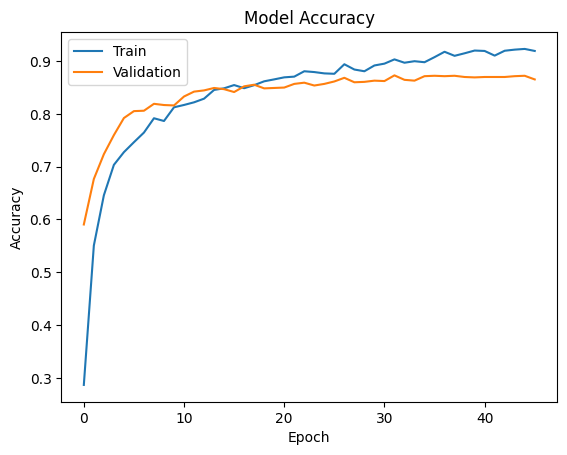

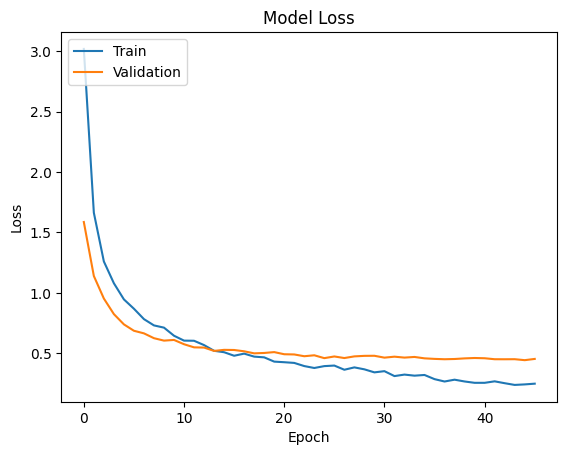

In [ ]:
# Combine the history of the initial training with the fine-tuning history
history_combined = {}
for key in history.history:
    history_combined[key] = history.history[key] + history_fine.history[key]

# Plot accuracy
plt.plot(history_combined['accuracy'])
plt.plot(history_combined['val_accuracy'])
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Plot loss
plt.plot(history_combined['loss'])
plt.plot(history_combined['val_loss'])
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.show()

## **Evaluation of Model on Test**

In [ ]:
# Load the saved model
model = keras.models.load_model("/kaggle/working/transfer_model_fine.keras")

# Evaluate the model on the test dataset
test_loss, test_accuracy = model.evaluate(test_ds)

print(f"Test Loss: {test_loss}")
print(f"Test Accuracy: {test_accuracy}")

12/12 ━━━━━━━━━━━━━━━━━━━━ 10s 127ms/step - accuracy: 0.9150 - loss: 0.3031
Test Loss: 0.34941622614860535
Test Accuracy: 0.909333348274231


## **Prediction of Model**

1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step


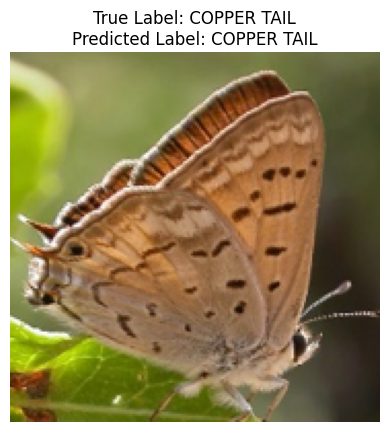

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


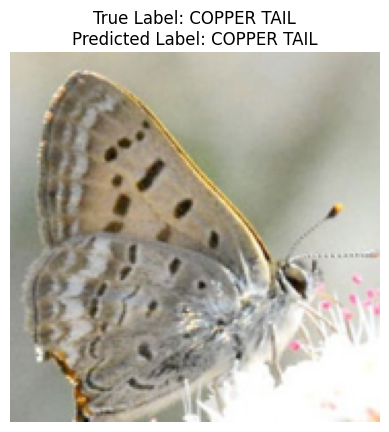

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


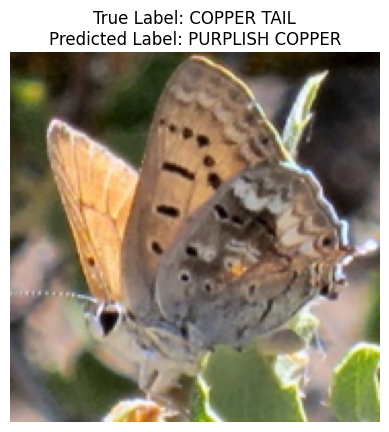

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


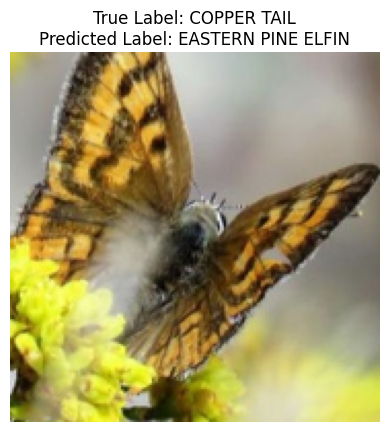

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


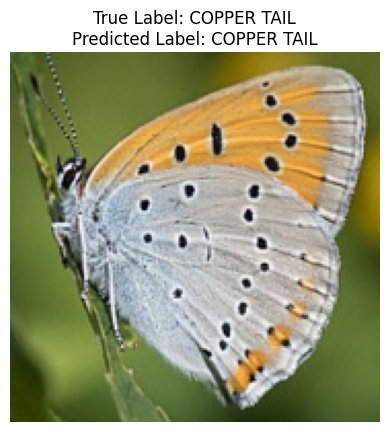

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


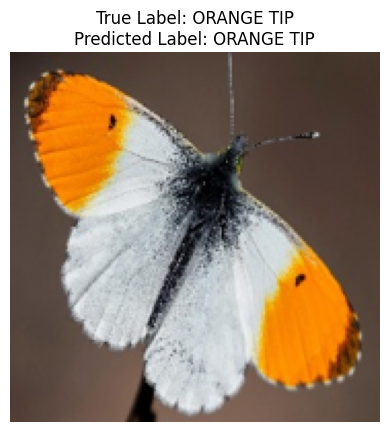

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


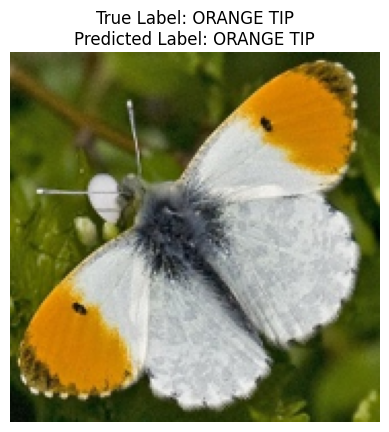

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


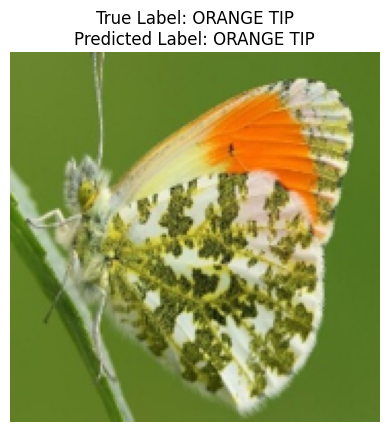

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


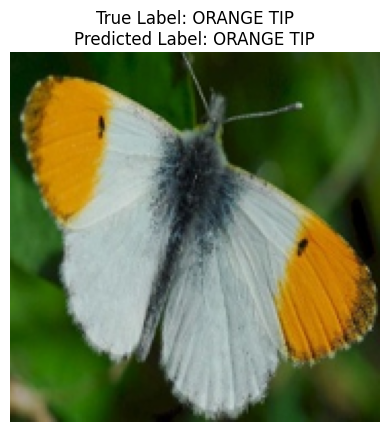

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


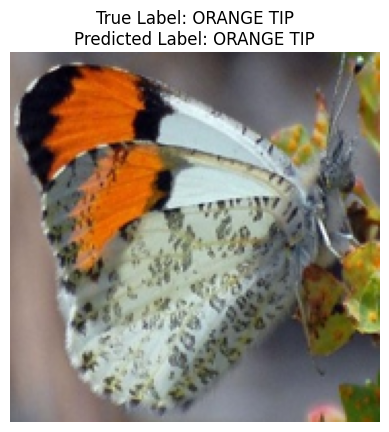

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


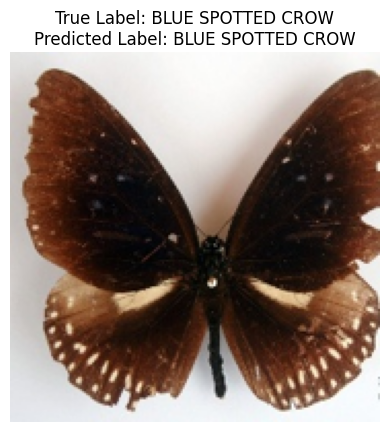

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


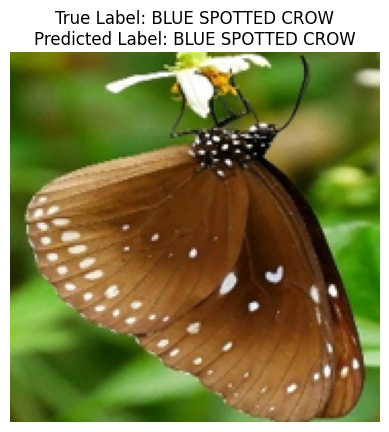

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


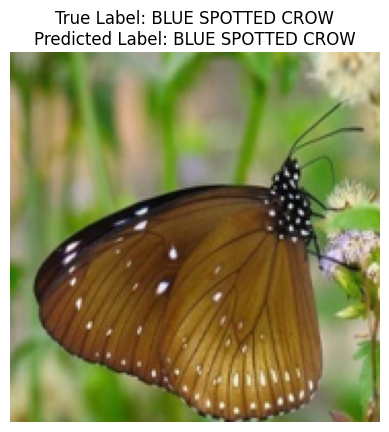

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


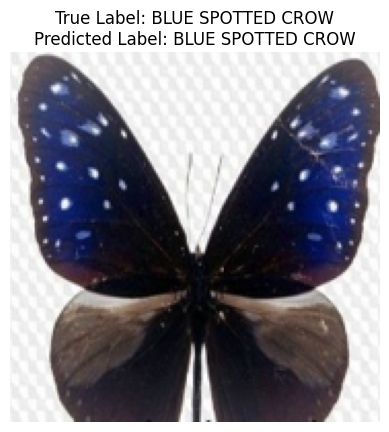

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


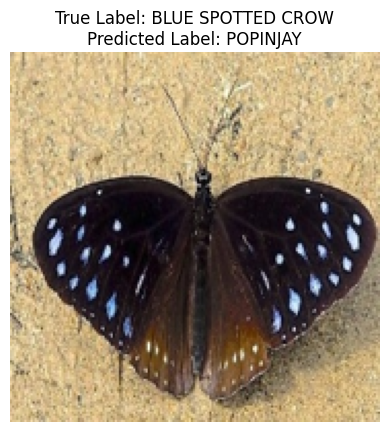

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


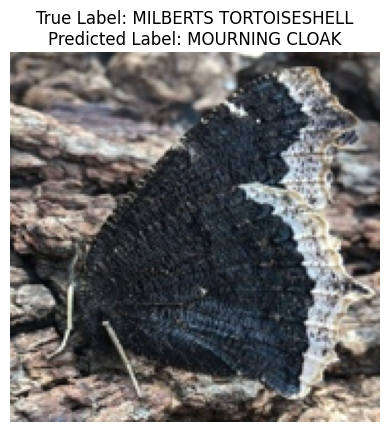

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


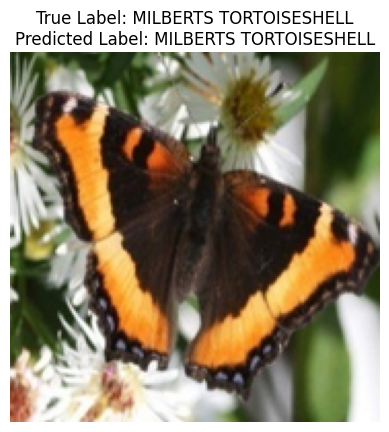

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


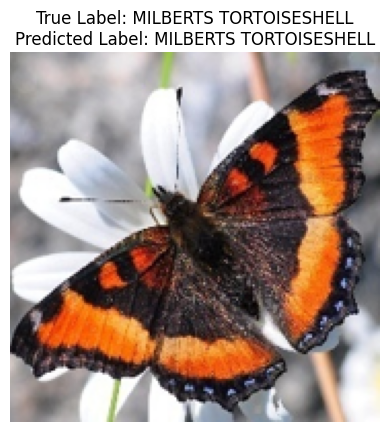

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


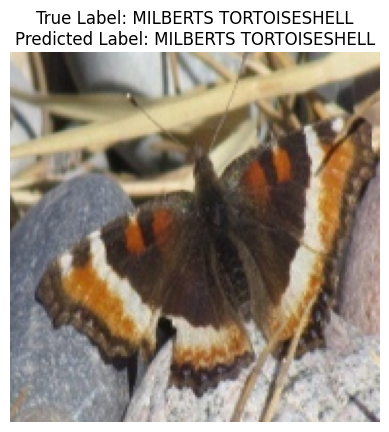

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


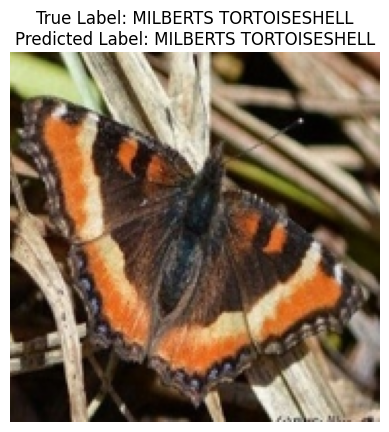

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


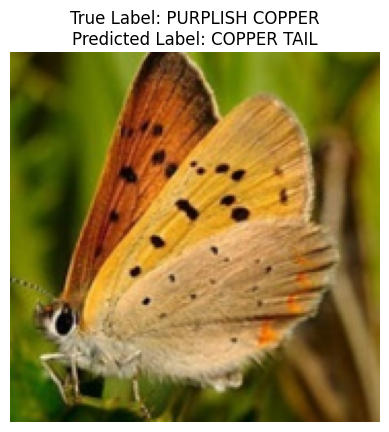

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


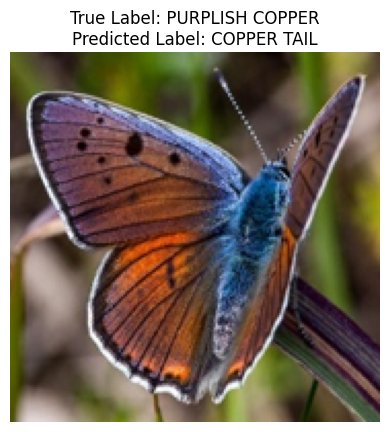

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


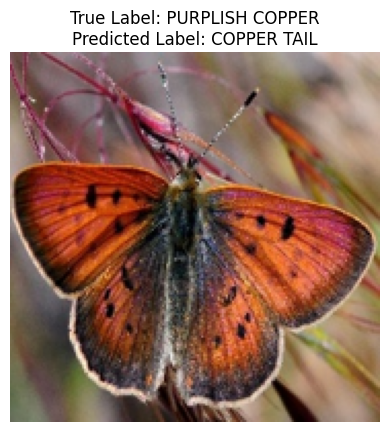

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


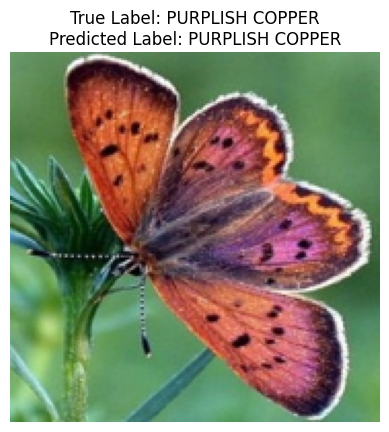

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


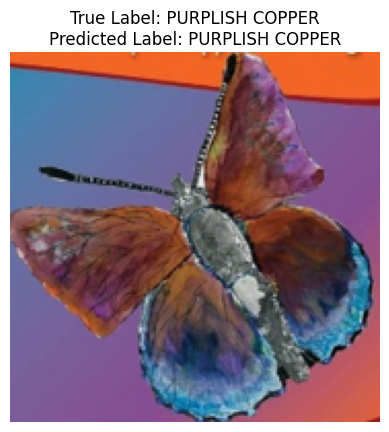

In [ ]:
# Set the directory containing the test images
test_directory = "/kaggle/input/butterfly-labelled/newbutterfly/test"

def predict_single_image_without_preprocessing(image_path, model):
  '''
  This function loads, resizes, and predicts the
  class label for the image without any preprocessing
  '''
    # Load the image and resize it to 180x180
    img = Image.open(image_path)
    img = img.resize((180, 180))
    # Convert the image to a numpy array
    img_array = np.array(img)
    # Expand dimensions to match the input shape expected by the model
    input_img = np.expand_dims(img_array, axis=0)
    # Perform prediction
    prediction = model.predict(input_img)
    # Get the predicted class label
    predicted_class = np.argmax(prediction, axis=1)[0]
    return predicted_class

# Get class names from directories in alphabetical order
class_names = sorted(os.listdir(test_directory))

# Randomly select 5 classes
selected_classes = random.sample(class_names, 5)

# Iterate over selected classes and select 5 images from class_directory
for class_name in selected_classes:
    class_directory = os.path.join(test_directory, class_name)
    image_files = os.listdir(class_directory)
    selected_images = random.sample(image_files, 5)

    # Iterate over selected images and perform prediction
    for image_file in selected_images:
        image_path = os.path.join(class_directory, image_file)
        true_label = class_name
        predicted_class = predict_single_image_without_preprocessing(image_path, model)
        predicted_class_name = class_names_sorted[predicted_class]

        # Display the original image along with its true label and the predicted label
        img = Image.open(image_path)
        img = img.resize((180, 180))
        plt.imshow(img)
        plt.title(f"True Label: {true_label}\nPredicted Label: {predicted_class_name}")
        plt.axis('off')

        plt.show()

### **Precision & Recall for each class:**

In [ ]:
# Initializes empty lists to store true labels and predicted labels
true_labels = []
predicted_labels = []

# Iterate over the test dataset and for each batch perform prediction and append the true labels and predicted labels to the respective lists
for image_batch, label_batch in test_ds:
    predictions_batch = model.predict(image_batch)
    predicted_classes_batch = np.argmax(predictions_batch, axis=1)
    true_labels.extend(label_batch)
    predicted_labels.extend(predicted_classes_batch)

# Convert lists to numpy arrays
true_labels = np.array(true_labels)
predicted_labels = np.array(predicted_labels)

# Calculate precision and recall
precision = precision_score(true_labels, predicted_labels, average=None)
recall = recall_score(true_labels, predicted_labels, average=None)

# Create DataFrame to store precision and recall for each class
data = {'Class': class_names_sorted, 'Precision': precision, 'Recall': recall}
precision_recall_df = pd.DataFrame(data)

# Display DataFrame using tabulate to display in a tabular format
print(tabulate(precision_recall_df, headers='keys', tablefmt='psql'))

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
+----+---------------------------+-------------+----------+
|    | Class                     |   Precision |   Recall |
|----+---------------------------+-------------+----------|
|  0 | ADONIS                    |    1        |      1   |
|  1 | AFRICAN GIANT SWALLOWTAIL |    1        |      1   |
|  2 | AMERICAN SNOOT            |    1        |      1   |
|  3 | AN 88                     |    1        |      1   |
|  4 | APPOLLO                   |    1        |      1   |
|  5 | ATALA                     |    1        |      1   |
|  6 | B

### **NOTE**
In the above code, we allow fine-tuning of the base model and from 564 layers we only use 314 layers, we freeze upto 250 layers. We then created callback functions for saving the best model, reducing the learning rate and stopping the model with appropriate conditions. We then compiled the model with reduced learning rate, RMSprop optimizer, sparse categorical cross-entropy loss, and accuracy metric and train for another 10 epochs.  We then plotted the Train VS Validation Accuracy & Loss graph and evaluated the model on test dataset and plotted predictions. <br>

The graph plotted has the least noise and is the best performing in terms of plot and the accruacy with minimum loss. Here, the model is also generalizing better than the two above. <br>

We then printed the precision and recall for each class to get insights into the model's performance on individual butterfly species. From the results some classes achieved perfect precision and recall values(eg. ADONIS, AFRICAN GIANT SWALLOWTAIL, AMERICAN SNOOT), whereas (eg. COPPER TAIL, SOUTHERN DOGFACE) had
lower precision and recall values.

In conclusion, transfer learning and fine-tuning model's performance outshines FCN and CNN model's.
